In [1]:
from rdkit import Chem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors
from rdkit.Chem import Crippen
from rdkit import DataStructs
from rdkit.Chem.SaltRemover import SaltRemover
from rdkit.Chem import Lipinski
from rdkit.Chem import AllChem

from rdkit.Chem.Draw import rdMolDraw2D
from IPython.display import SVG
import itertools
import gzip

from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import re
import csv

import warnings
warnings.filterwarnings('ignore')

In [2]:
# function for Lipinski's descriptors
lip_func = [("HBA", Lipinski.NumHAcceptors), ("HBD", Lipinski.NumHDonors), ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), ("TPSA", rdMolDescriptors.CalcTPSA), ("RB", Lipinski.NumRotatableBonds)]

In [3]:
""" contribution from Hans de Winter """
def _InitialiseNeutralisationReactions():
    patts= (
        # Imidazoles
        ('[n+;H]','n'),
        # Amines
        ('[N+;!H0]','N'),
        # Carboxylic acids and alcohols
        ('[$([O-]);!$([O-][#7])]','O'),
        # Thiols
        ('[S-;X1]','S'),
        # Sulfonamides
        ('[$([N-;X2]S(=O)=O)]','N'),
        # Enamines
        ('[$([N-;X2][C,N]=C)]','N'),
        # Tetrazoles
        ('[n-]','[nH]'),
        # Sulfoxides
        ('[$([S-]=O)]','S'),
        # Amides
        ('[$([N-]C=O)]','N'),
    )
    return [(Chem.MolFromSmarts(x),Chem.MolFromSmiles(y,False)) for x,y in patts]

_reactions=None
def NeutraliseCharges(mol, reactions=None):
    global _reactions
    if reactions is None:
        if _reactions is None:
            _reactions=_InitialiseNeutralisationReactions()
        reactions=_reactions
    replaced = False
    for i,(reactant, product) in enumerate(reactions):
        while mol.HasSubstructMatch(reactant):
            replaced = True
            rms = Chem.ReplaceSubstructs(mol, reactant, product)
            mol = rms[0]
    return mol, replaced

In [4]:
_saltRemover = SaltRemover()
_inorganicPatt = Chem.MolFromSmarts("[!#6;!#7;!#8;!#16;!F;!Cl;!Br;!I]") # to remove compounds with unwanted atom types
_carbonPatt = Chem.MolFromSmarts("[#6]") # to remove compounds without carbon - inorganic
def standardize(mol):
    if mol.HasSubstructMatch(_carbonPatt):
        mol = _saltRemover(mol)
        if mol.GetNumAtoms()==0:
            return None
        else:
            mol, neutralized = NeutraliseCharges(mol)
            if mol.HasSubstructMatch(_inorganicPatt):
                return None
            else:
                # Sanitize mol, without sanitization some structures can't be drawn or fingerprinted
                try:
                    Chem.SanitizeMol(mol)
                except Exception as e:
                    return None
                return mol
    else:
        return None

In [5]:
# some pChEMBL values in our file are not valid floats
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")
with open("../fadeeva/serine_threonine_protein_kinase.csv") as inp:
    kinase = [row for row in csv.DictReader(inp, delimiter=";", quotechar='"')]
    for m in kinase:
        mol = Chem.MolFromSmiles(m["Smiles"])
        if mol:
            m["rdmol"] = mol
            stdmol = standardize(mol)
            m["source"] = "kinase"
            m["pChEMBL Value"] = float(m["pChEMBL Value"]) if float_pattern.match(m["pChEMBL Value"]) else 0
            m["std_rdmol"] = None
            m["Standard Value"] = float(m["Standard Value"]) if float_pattern.match(m["Standard Value"]) else np.NaN
        if stdmol:
            m["std_rdmol"] = stdmol
            m["std_smiles"] = Chem.MolToSmiles(stdmol)
            m["fps"] = AllChem.GetMorganFingerprintAsBitVect(m["std_rdmol"],2,nBits=1024)
            for f in lip_func:
                m[f[0]] = f[1](m["std_rdmol"])

In [6]:
kinase

[{'Molecule ChEMBL ID': 'CHEMBL1807302',
  'Molecule Name': '',
  'Molecule Max Phase': 'None',
  'Molecular Weight': '716.81',
  '#RO5 Violations': '2',
  'AlogP': '6.70',
  'Compound Key': '21',
  'Smiles': 'CCc1cccc(CC)c1NC(=O)c1nn(C)c2c1CCc1cnc(Nc3ccc(C(=O)N4CCC[C@H]4CN4CCCC4)cc3OC(F)(F)F)nc1-2',
  'Standard Type': 'IC50',
  'Standard Relation': "'>'",
  'Standard Value': 10000.0,
  'Standard Units': 'nM',
  'pChEMBL Value': 0,
  'Data Validity Comment': '',
  'Comment': '',
  'Uo Units': 'UO_0000065',
  'Ligand Efficiency BEI': '',
  'Ligand Efficiency LE': '',
  'Ligand Efficiency LLE': '',
  'Ligand Efficiency SEI': '',
  'Potential Duplicate': '0',
  'Assay ChEMBL ID': 'CHEMBL1809662',
  'Assay Description': 'Inhibition of Aur-A assessed as [33P]-gamma-ATP incorporation into substrate by gamma counting',
  'Assay Type': 'B',
  'BAO Format ID': 'BAO_0000357',
  'BAO Label': 'single protein format',
  'Assay Organism': 'None',
  'Assay Tissue ChEMBL ID': 'None',
  'Assay Tissue N

In [7]:
%%capture
# %%capture hides stderr (and maybe all output)
# same for drugbank
drugbank = []
for m in Chem.SDMolSupplier("../data/drugbank.sdf"):
    if m:
        stdmol = standardize(m)
    else:
        continue
    if stdmol:
        std_smiles = Chem.MolToSmiles(stdmol)
        drugbank.append({
            "rdmol": m,
            "std_rdmol": stdmol,
            "source": "drugbank",
            "std_smiles": std_smiles,
            "Smiles": Chem.MolToSmiles(m),
            "pChEMBL Value": 0,
            "Standard Value": np.NaN,
            "fps": AllChem.GetMorganFingerprintAsBitVect(stdmol, 2, nBits=1024),
            **{f[0]: f[1](stdmol) for f in lip_func}
        })


In [8]:
# let's work with Pandas dataframe
df = pd.DataFrame((*drugbank, *[m for m in kinase if m["std_rdmol"]]), columns=["Smiles", "std_smiles", "source", "rdmol", "std_rdmol", "fps", "Standard Value", "pChEMBL Value", *(f[0] for f in lip_func)])
# adds index as normal column
df.reset_index(level=0, inplace=True)
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["std_rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
             )

print(f"Total kinase molecules loaded: {len(kinase)}")
print(f"Standardized kinase molecules: {sum(1 for m in kinase if m['std_rdmol'])}")

Total kinase molecules loaded: 3787
Standardized kinase molecules: 3777


In [9]:
molecules = df['Smiles'].apply(Chem.MolFromSmiles)

# Number of rings
df['rings'] = molecules.apply(lambda mol: mol.GetRingInfo().NumRings() if mol is not None else np.nan)

# Heavy atom count
df['heavy_atoms'] = molecules.apply(lambda mol: mol.GetNumHeavyAtoms() if mol is not None else np.nan)

# Topological Polar Surface Area (TPSA)
df['TPSA'] = molecules.apply(lambda mol: rdMolDescriptors.CalcTPSA(mol) if mol is not None else np.nan)

In [10]:
df

,index,Smiles,std_smiles,source,rdmol,std_rdmol,fps,Standard Value,pChEMBL Value,HBA,...,MQN_35,MQN_36,MQN_37,MQN_38,MQN_39,MQN_40,MQN_41,MQN_42,rings,heavy_atoms
0,0,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,CC[C@H](C)[C@H](NC(=O)[C@H](CCC(=O)O)NC(=O)[C@...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x167ae5f90>,<rdkit.Chem.rdchem.Mol object at 0x167ae8740>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",NaN,0.00,29,...,3,3,0,0,0,0,0,0,6,155
1,1,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,CC(C)C[C@H](NC(=O)[C@@H](COC(C)(C)C)NC(=O)[C@H...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x167aed660>,<rdkit.Chem.rdchem.Mol object at 0x167af0350>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",NaN,0.00,16,...,4,2,0,0,0,0,2,1,6,91
2,2,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,N=C(N)NCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x167af0510>,<rdkit.Chem.rdchem.Mol object at 0x167af0660>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",NaN,0.00,15,...,1,2,0,0,0,1,0,0,4,74
3,3,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,CC(=O)N[C@H](Cc1ccc2ccccc2c1)C(=O)N[C@H](Cc1cc...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x167af0430>,<rdkit.Chem.rdchem.Mol object at 0x167af07b0>,"[0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",NaN,0.00,16,...,1,5,0,0,0,0,2,1,6,102
4,4,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,C/C=C/C[C@@H](C)[C@@H](O)[C@H]1C(=O)N[C@@H](CC...,drugbank,<rdkit.Chem.rdchem.Mol object at 0x167af0890>,<rdkit.Chem.rdchem.Mol object at 0x167af09e0>,"[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, ...",NaN,0.00,12,...,0,0,0,0,0,1,0,0,1,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9919,9919,CCOC(=O)c1[nH]cc2c1NC1=C(C(=O)CCC1)C2c1ccc(Sc2...,CCOC(=O)c1[nH]cc2c1NC1=C(C(=O)CCC1)C2c1ccc(Sc2...,kinase,<rdkit.Chem.rdchem.Mol object at 0x167ae89e0>,<rdkit.Chem.rdchem.Mol object at 0x167ae87b0>,"[0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",500.0,0.00,7,...,3,3,0,0,0,0,6,3,6,34
9920,9920,Nc1nc(Nc2ccc(S(N)(=O)=O)cc2)nn1C(=O)c1c(F)cccc1F,Nc1nc(Nc2ccc(S(N)(=O)=O)cc2)nn1C(=O)c1c(F)cccc1F,kinase,<rdkit.Chem.rdchem.Mol object at 0x167ae8200>,<rdkit.Chem.rdchem.Mol object at 0x167aebf90>,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",11.0,7.96,8,...,1,2,0,0,0,0,0,0,3,27
9921,9921,CCN1CCN(c2ccc(Nc3cc(N(C)C(=O)Nc4c(Cl)c(OC)cc(O...,CCN1CCN(c2ccc(Nc3cc(N(C)C(=O)Nc4c(Cl)c(OC)cc(O...,kinase,<rdkit.Chem.rdchem.Mol object at 0x167aebac0>,<rdkit.Chem.rdchem.Mol object at 0x167aeb890>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",10000.0,0.00,8,...,0,4,0,0,0,0,0,0,4,38
9922,9922,CCN1CCN(C(=O)Cc2ccc(Nc3ncc(F)c(Nc4ccc(C(=O)Nc5...,CCN1CCN(C(=O)Cc2ccc(Nc3ncc(F)c(Nc4ccc(C(=O)Nc5...,kinase,<rdkit.Chem.rdchem.Mol object at 0x167aeb270>,<rdkit.Chem.rdchem.Mol object at 0x167ae17b0>,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",3.4,8.47,7,...,0,5,0,0,0,0,0,0,5,42


## Dataset Analysis

<Axes: xlabel='variable', ylabel='value'>

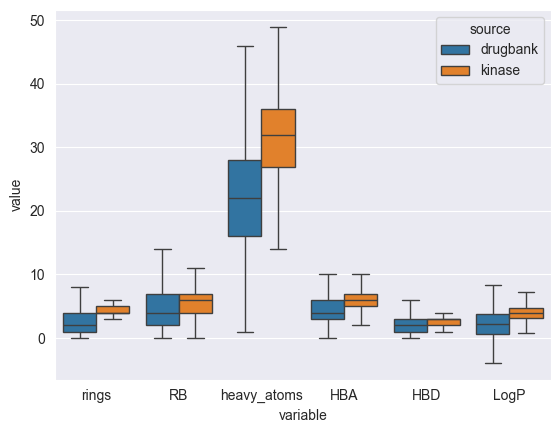

In [11]:
df_melted = df.melt(id_vars='source', value_vars=['rings', 'RB', 'heavy_atoms', 'HBA', 'HBD', 'LogP'])

sns.boxplot(y='value', x='variable', hue='source',
            data=df_melted,
            showfliers=False)

<Axes: xlabel='variable', ylabel='value'>

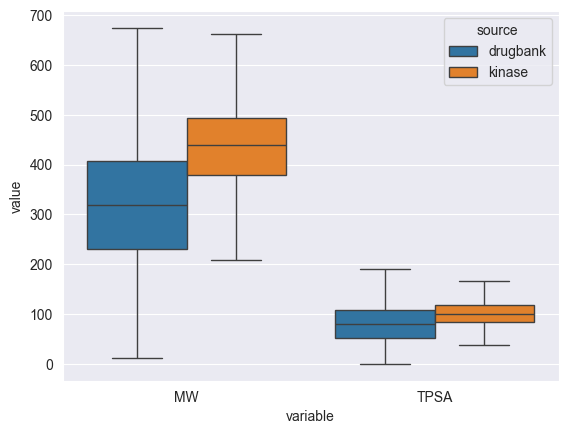

In [12]:
df_melted_2 = df.melt(id_vars='source', value_vars=['MW', 'TPSA'])

sns.boxplot(y='value', x='variable', hue='source',
            data=df_melted_2,
            showfliers=False)

In [13]:
def too_many_hbd(mol):
    # takes an RDKit mol instance, returns True if the structure is out of LRO5 bounds
    return rdMolDescriptors.CalcNumLipinskiHBD(mol) > 5

def too_many_hba(mol):
    return rdMolDescriptors.CalcNumLipinskiHBA(mol) > 10

def too_heavy(mol):
    return rdMolDescriptors.CalcExactMolWt(mol) > 500

def too_greasy(mol):
    return Crippen.MolLogP(mol) > 5

def ro5_violations(mol):
    # takes RDKit mol, return how many rules it actually violates
    return sum([too_many_hbd(mol), too_many_hba(mol), too_heavy(mol), too_greasy(mol)])

def violates_lipinski(mol):
    # checks the number of RO5 violations, if they are more than one, return True
    return ro5_violations(mol) > 1

def bad_greasyness_ghose(mol):
    logp = Crippen.MolLogP(mol)
    return logp > 5.6 or logp < -0.4

def bad_refractivity_ghose(mol):
    ref = Crippen.MolMR(mol)
    return ref > 130 or ref < 40

def bad_mw_ghose(mol):
    mw = rdMolDescriptors.CalcExactMolWt(mol)
    return mw > 480 or mw < 180

def bad_atomcount_ghose(mol):
    ac = mol.GetNumHeavyAtoms()
    return ac > 70 or ac < 20

def violates_ghose(mol):
    return bad_greasyness_ghose(mol) or bad_refractivity_ghose(mol) or bad_mw_ghose(mol) or bad_atomcount_ghose(mol)

def too_rotatable_veber(mol):
    return rdMolDescriptors.CalcNumRotatableBonds(mol) > 10

def too_large_psa_veber(mol):
    return rdMolDescriptors.CalcTPSA(mol) > 140

def violates_veber(mol):
    return too_rotatable_veber(mol) or too_large_psa_veber(mol)

In [14]:
# Calculate properties and rule violations
df['too_many_hbd'] = df['std_rdmol'].apply(lambda mol: too_many_hbd(mol) if mol is not None else np.nan)
df['too_many_hba'] = df['std_rdmol'].apply(lambda mol: too_many_hba(mol) if mol is not None else np.nan)
df['too_heavy'] = df['std_rdmol'].apply(lambda mol: too_heavy(mol) if mol is not None else np.nan)
df['too_greasy'] = df['std_rdmol'].apply(lambda mol: too_greasy(mol) if mol is not None else np.nan)
df['violates_lipinski'] = df['std_rdmol'].apply(lambda mol: violates_lipinski(mol) if mol is not None else np.nan)

df['bad_greasyness_ghose'] = df['std_rdmol'].apply(lambda mol: bad_greasyness_ghose(mol) if mol is not None else np.nan)
df['bad_refractivity_ghose'] = df['std_rdmol'].apply(lambda mol: bad_refractivity_ghose(mol) if mol is not None else np.nan)
df['bad_mw_ghose'] = df['std_rdmol'].apply(lambda mol: bad_mw_ghose(mol) if mol is not None else np.nan)
df['bad_atomcount_ghose'] = df['std_rdmol'].apply(lambda mol: bad_atomcount_ghose(mol) if mol is not None else np.nan)
df['violates_ghose'] = df['std_rdmol'].apply(lambda mol: violates_ghose(mol) if mol is not None else np.nan)

df['too_rotatable_veber'] = df['std_rdmol'].apply(lambda mol: too_rotatable_veber(mol) if mol is not None else np.nan)
df['too_large_psa_veber'] = df['std_rdmol'].apply(lambda mol: too_large_psa_veber(mol) if mol is not None else np.nan)
df['violates_veber'] = df['std_rdmol'].apply(lambda mol: violates_veber(mol) if mol is not None else np.nan)

In [15]:
# List of rule columns
violation_columns = [
    'too_many_hbd', 'too_many_hba', 'too_heavy', 'too_greasy', 'violates_lipinski',
    'bad_greasyness_ghose', 'bad_refractivity_ghose', 'bad_mw_ghose', 'bad_atomcount_ghose', 'violates_ghose',
    'too_rotatable_veber', 'too_large_psa_veber', 'violates_veber'
]

# Melt into long format
df_melted_3 = df.melt(id_vars='source', value_vars=violation_columns,
                    var_name='Rule', value_name='Violated')

# Calculate violation rates
violation_rates = (
    df_melted_3.groupby(['Rule', 'source'])['Violated']
    .mean()
    .reset_index()
)

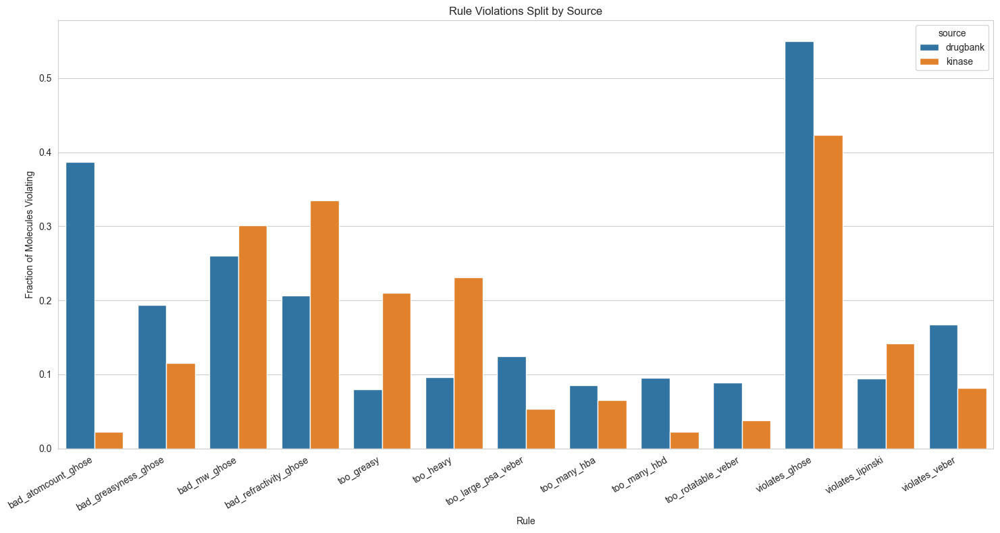

In [16]:
with sns.axes_style("whitegrid"):
    plt.figure(figsize=(15, 8))
    sns.barplot(data=violation_rates, x='Rule', y='Violated', hue='source')
    plt.title('Rule Violations Split by Source')
    plt.ylabel('Fraction of Molecules Violating')
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()

## Chemical space and its visualization

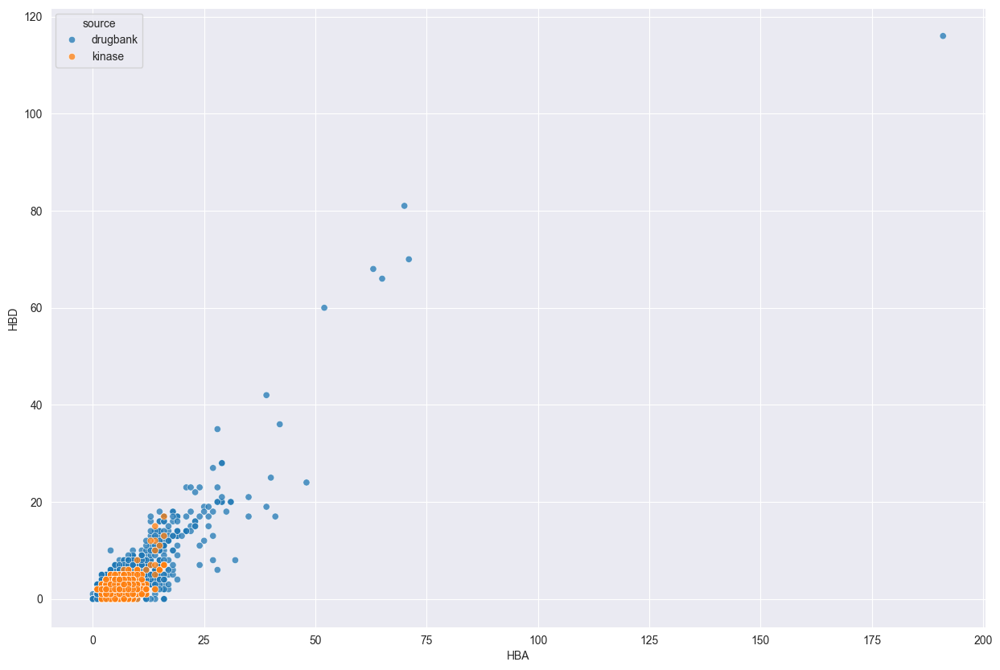

In [17]:
from matplotlib import pyplot

fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x="HBA",
                      y="HBD",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                      )

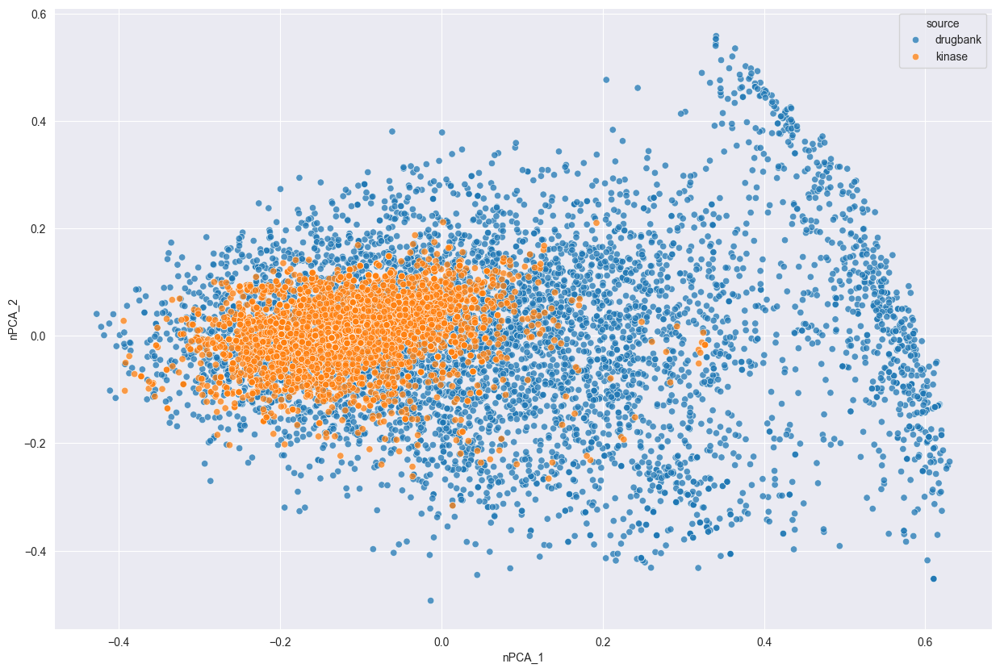

In [18]:
from sklearn import decomposition
from sklearn import preprocessing

pca = decomposition.PCA(n_components=42)
pca.fit(df[(f"MQN_{x}" for x in range(1, 43))])
df = df.join(pd.DataFrame(pca.transform(df[(f"MQN_{x}" for x in range(1, 43))]),
                          columns=[f"PCA_{x}" for x in range(1, 43)])
             )

norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                      )

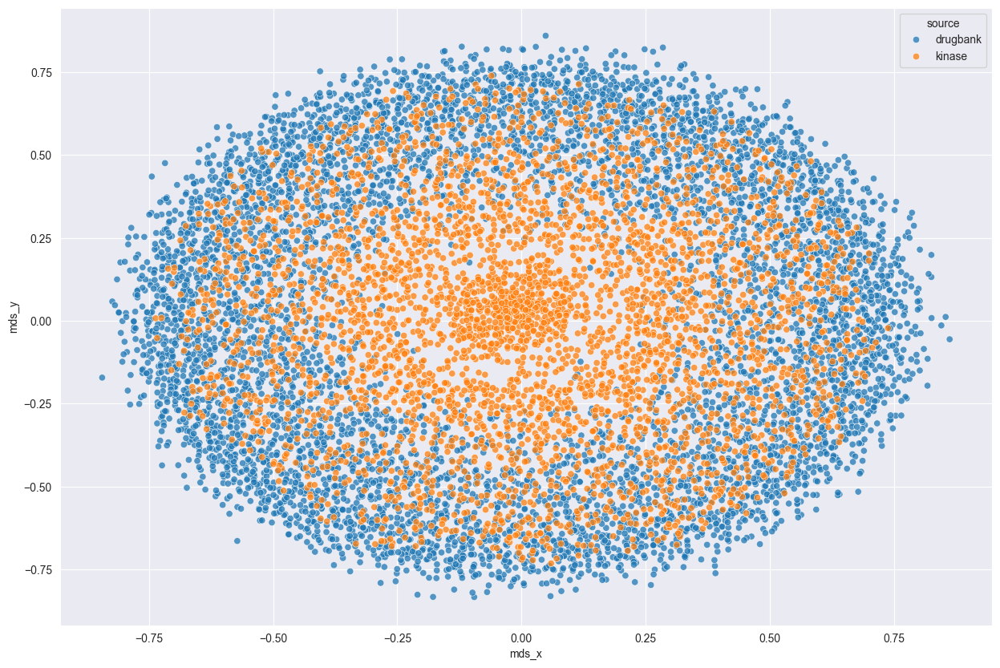

In [19]:
from scipy.spatial import distance
from sklearn import manifold

sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)

df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x="mds_x",
                      y="mds_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                      )

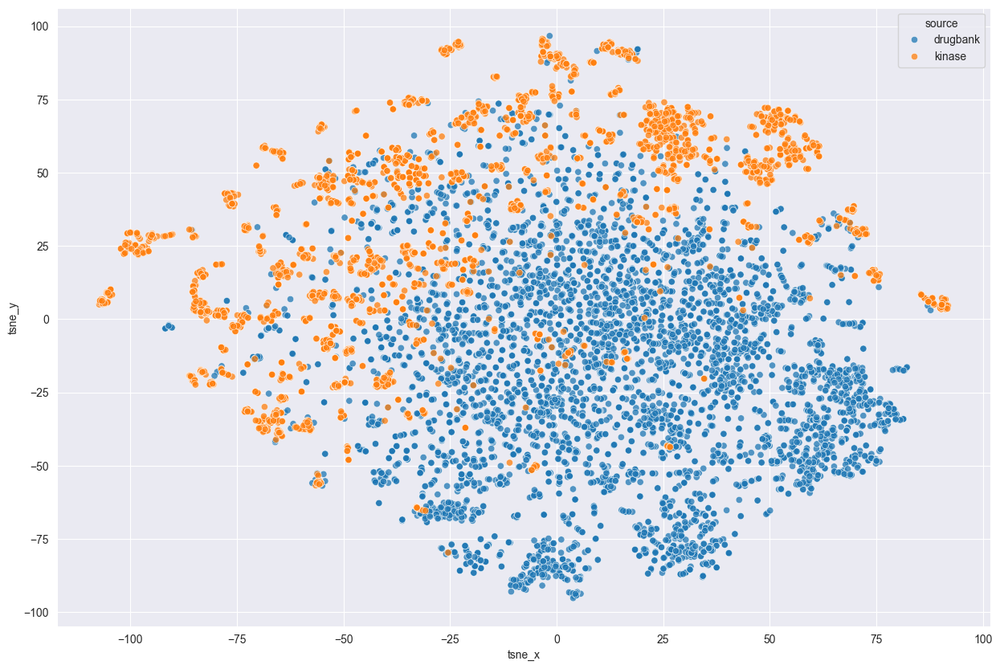

In [20]:
clf = manifold.TSNE(n_components=2, metric="precomputed", init="random")
X_tsne = clf.fit_transform(dist_mat)

df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                      )

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


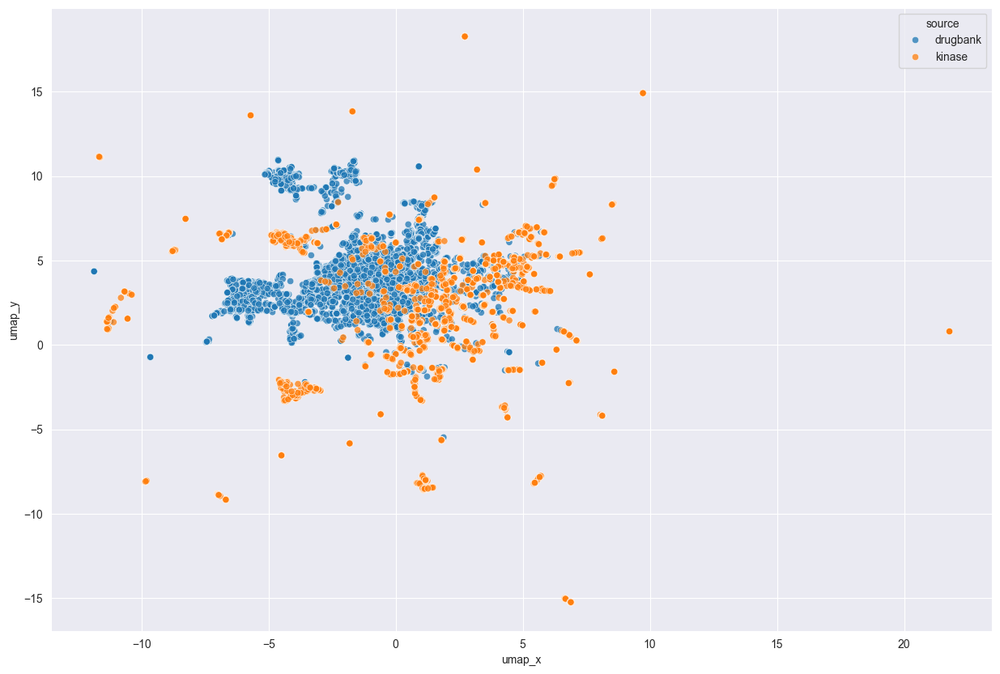

In [21]:
import umap
reducer = umap.UMAP(metric="precomputed")
embedding = reducer.fit_transform(dist_mat)

df = df.join(pd.DataFrame(embedding, columns=["umap_x", "umap_y"]))

fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x="umap_x",
                      y="umap_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                      )

## Clustering

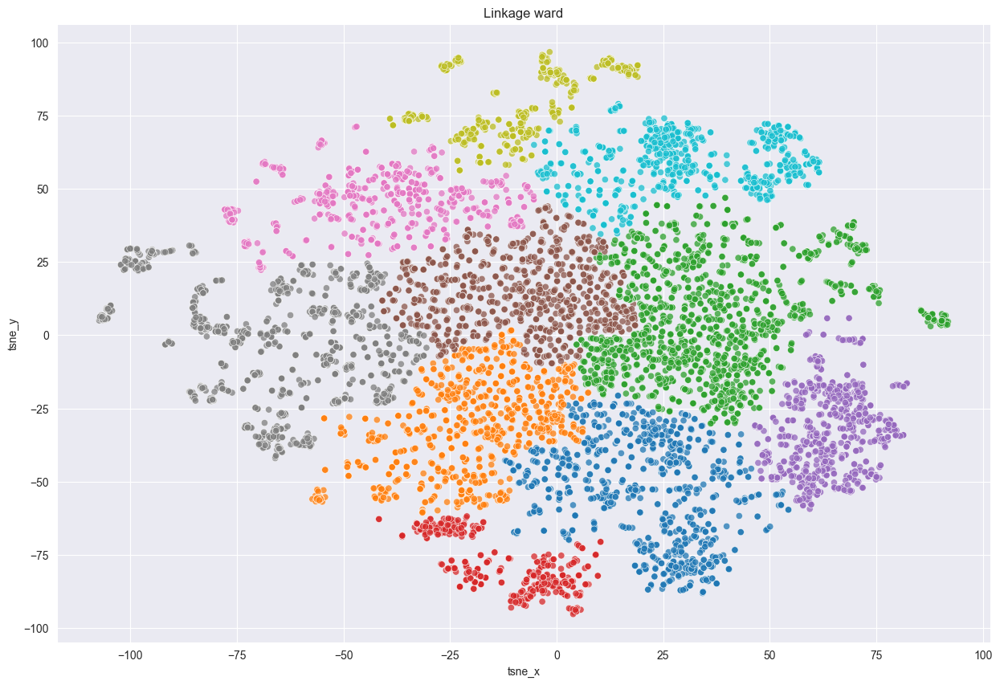

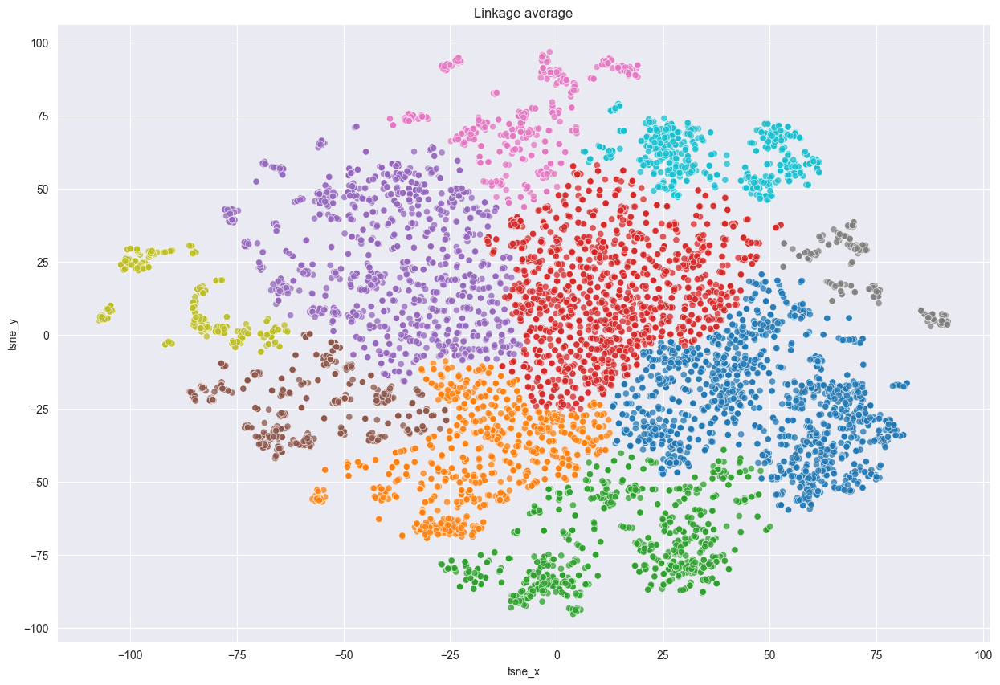

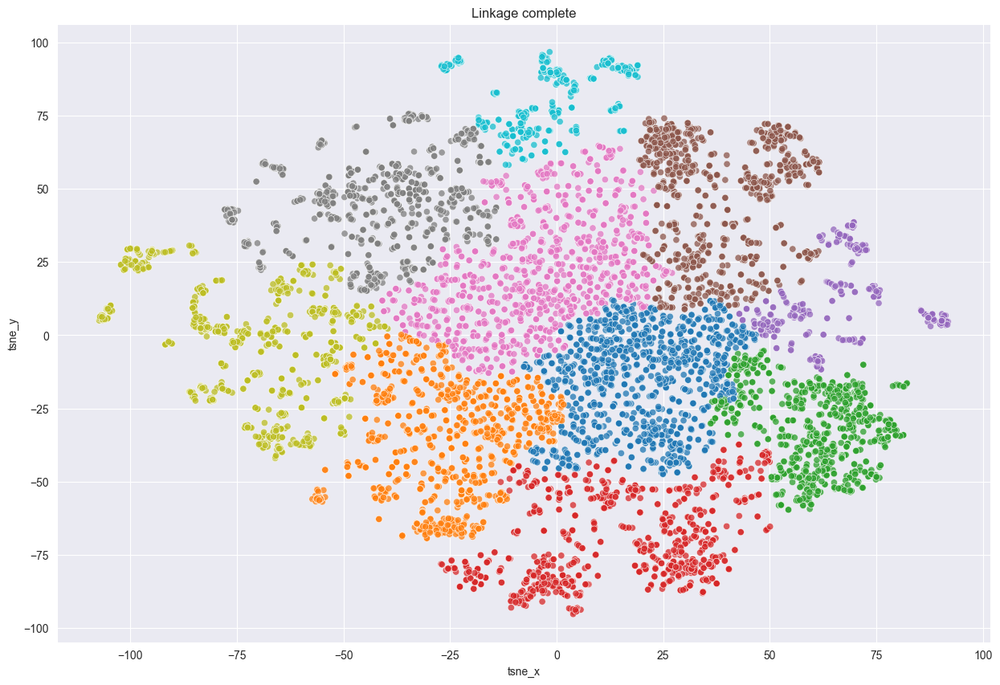

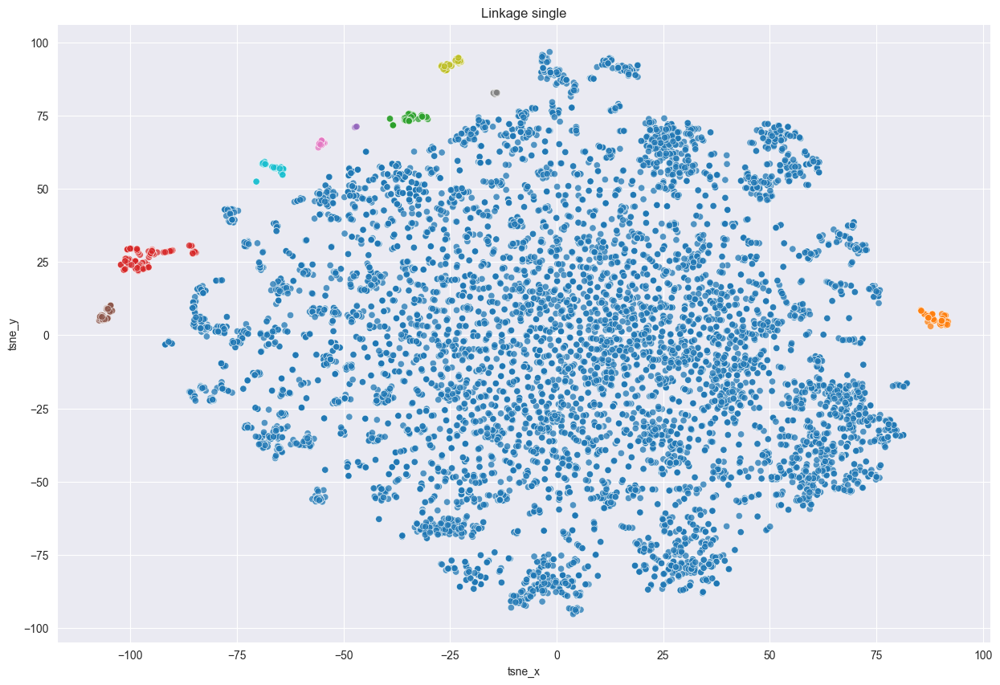

In [22]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[["tsne_x", "tsne_y"]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=sns.scatterplot(x="tsne_x",
                          y="tsne_y",
                          data=df,
                          hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                          ax=ax,
                          alpha=0.75,
                          legend=False
                          ).set_title(f"Linkage {linkage}")


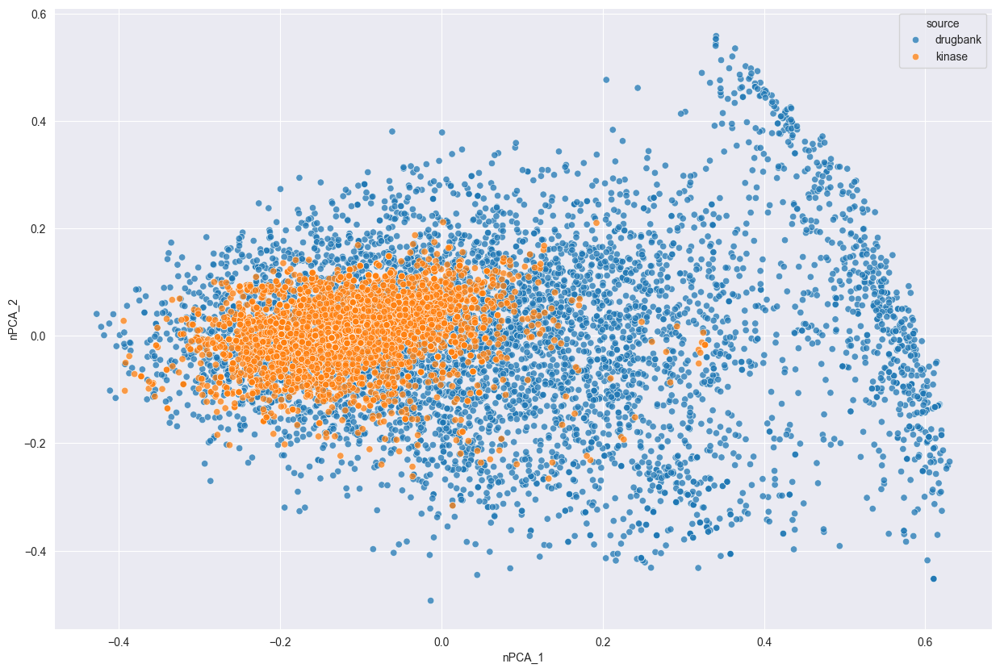

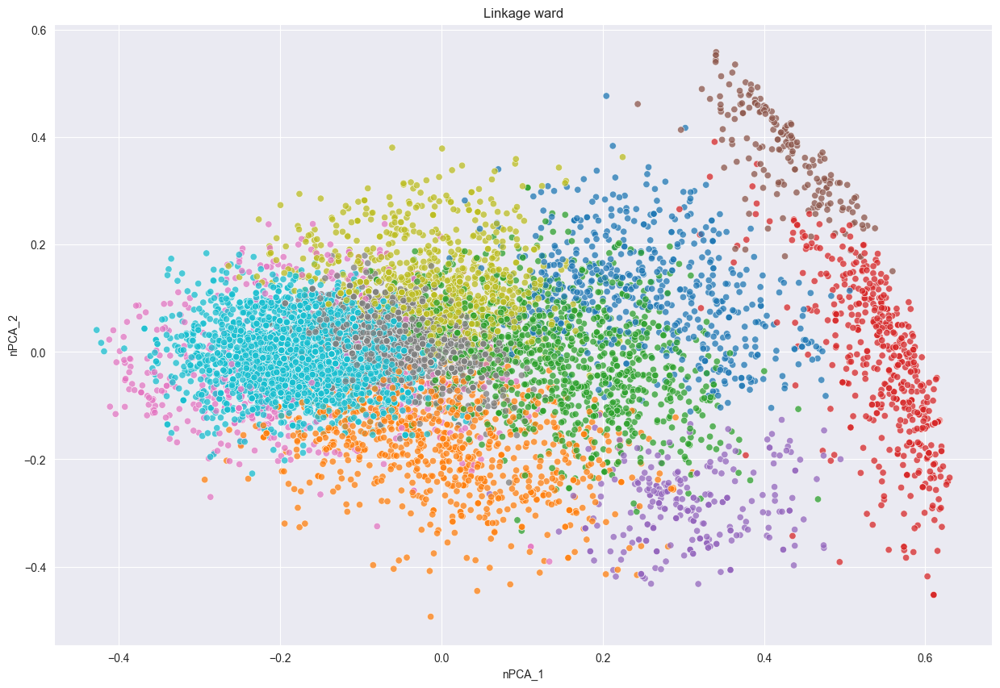

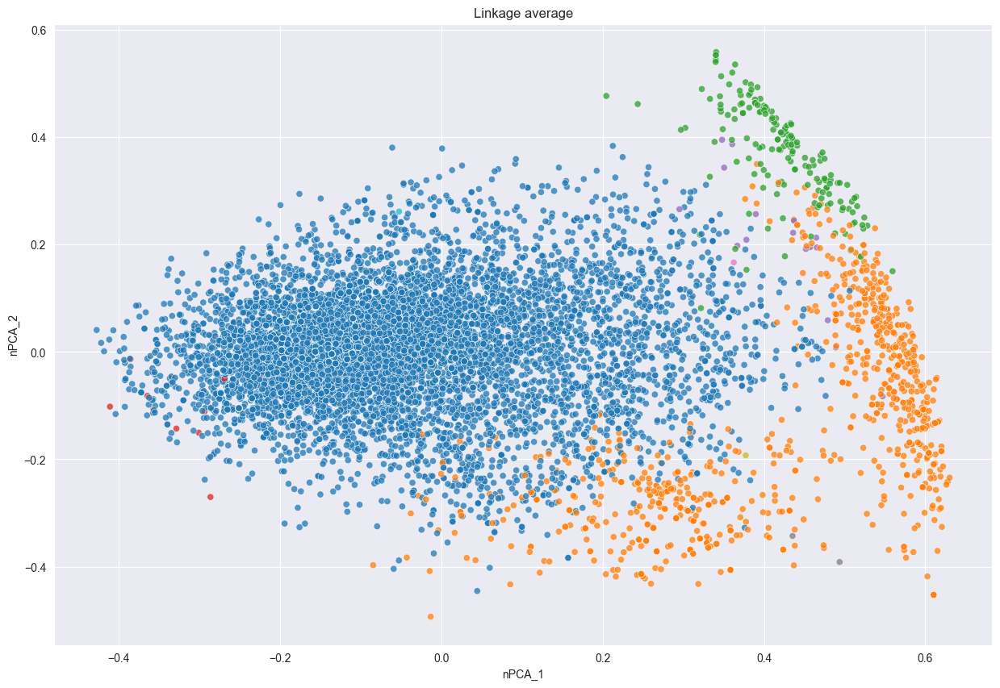

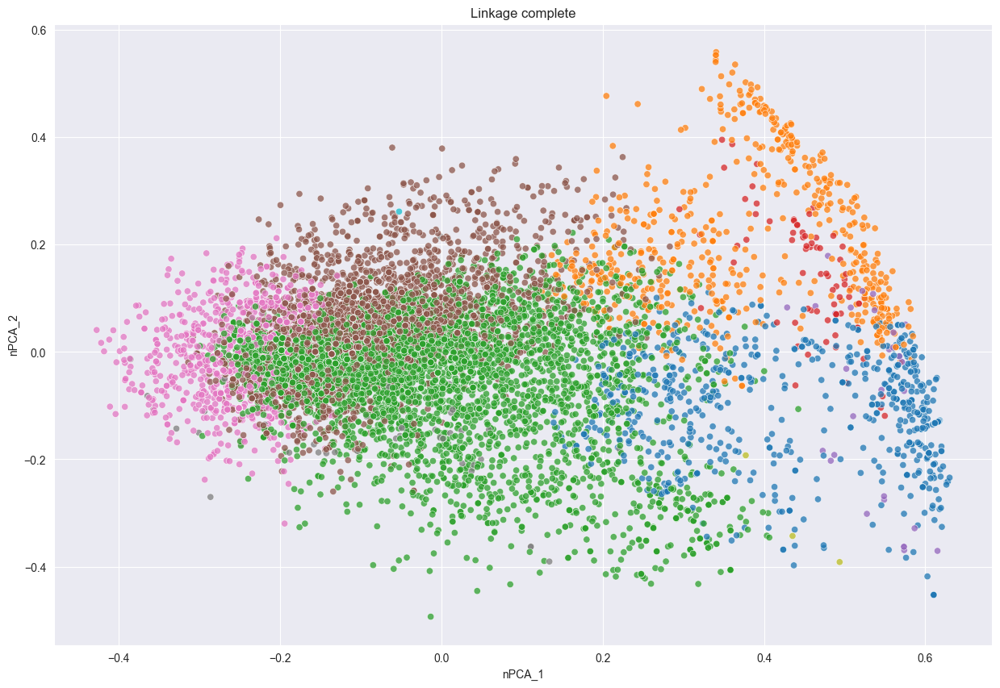

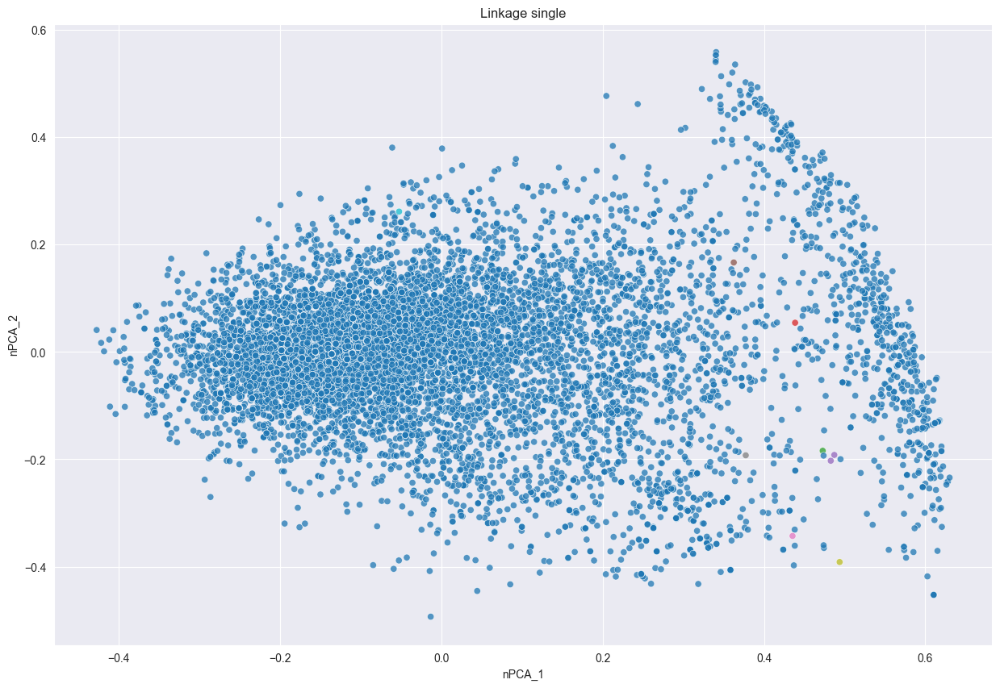

In [23]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                      )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=sns.scatterplot(x="nPCA_1",
                          y="nPCA_2",
                          data=df,
                          hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                          ax=ax,
                          alpha=0.75,
                          legend=False,
                          ).set_title(f"Linkage {linkage}")


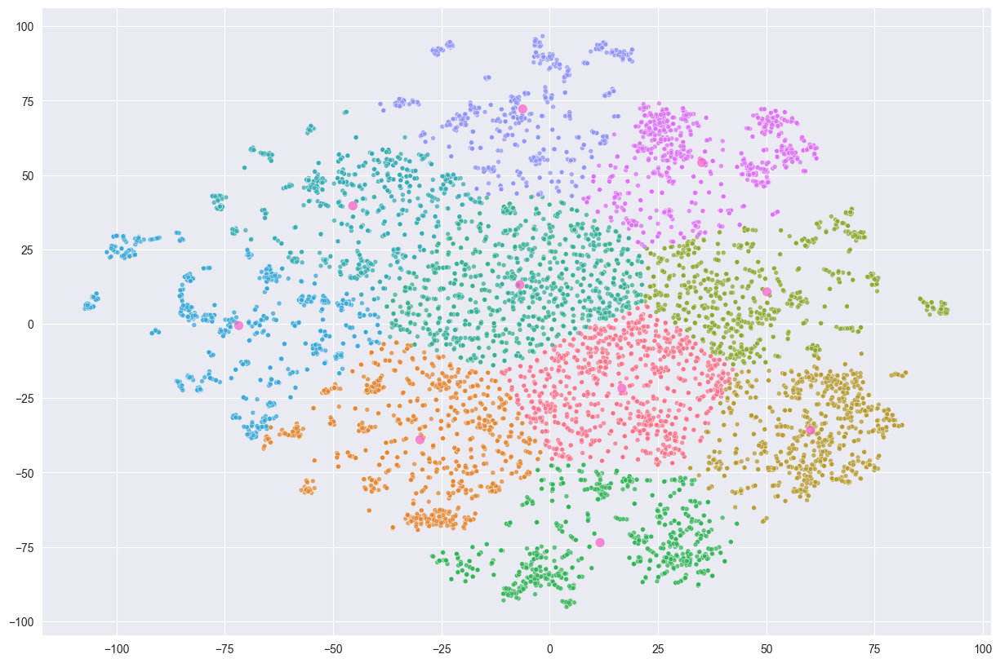

In [24]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                      y=[*df["tsne_y"], *centroids[:, 1]],
                      hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                      size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                      )

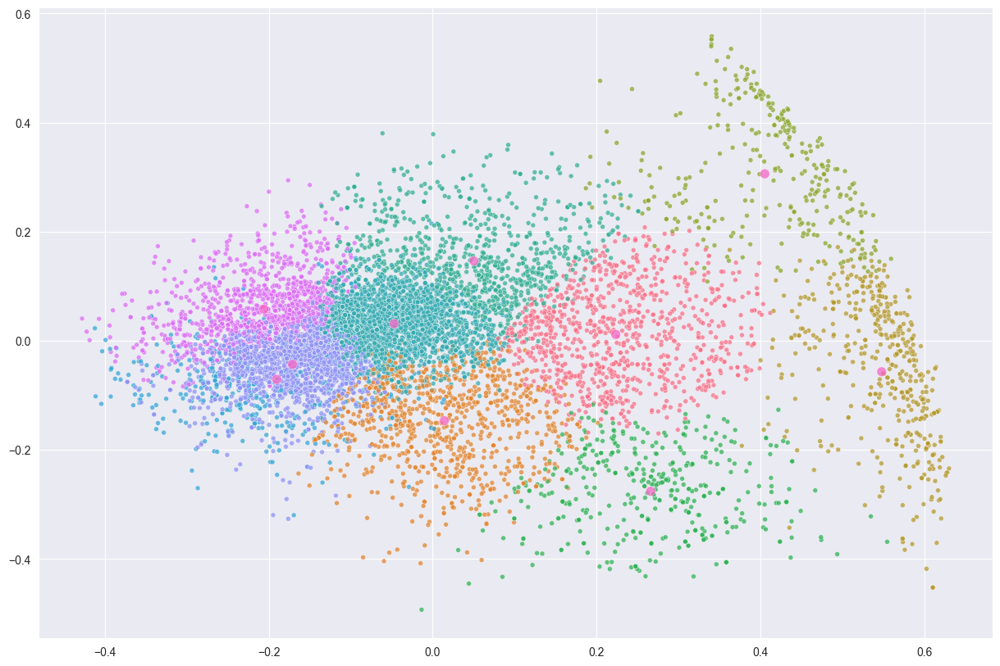

In [25]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=sns.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                      y=[*df["nPCA_2"], *centroids[:, 1]],
                      hue=[pyplot.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                      size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                      )

## Modeling

In [26]:
from sklearn import svm
from sklearn import ensemble
from sklearn import model_selection
from sklearn.metrics import mean_squared_error

In [35]:
train_set, testset = model_selection.train_test_split(df[df["pChEMBL Value"]>0], test_size=0.4, random_state=42)
val_set, test_set = model_selection.train_test_split(testset, test_size=0.5, random_state=42)

train_set.reset_index(inplace=True)
val_set.reset_index(inplace=True)
test_set.reset_index(inplace=True)

In [43]:
def get_results(model, data, descriptors, predicted_value):
    res = pd.DataFrame(model.predict(data[descriptors])).join(data[[predicted_value, "source"]])
    res.columns = ["Prediction", predicted_value, "Source"]
    print(f"""Average error whole set: {(res["Prediction"]-res[predicted_value]).abs().mean()}
Average error kinase: {(res[res["Source"]=="kinase"]["Prediction"]-res[res["Source"]=="kinase"][predicted_value]).abs().mean()}""")
    return res

In [ ]:
descriptors = [f"nPCA_{x}" for x in range(1, 43)]

